In [ ]:
import re
import os
import random
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from scipy import sparse
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline

In [ ]:
seed=1
random.seed(seed)
os.environ['PYTHONHASHSEED']  = str(seed)
np.random.seed(seed)

In [ ]:
from google.colab import drive, files

try:
  drive.mount('/content/drive')

  %cd /content/drive/My Drive
except:
  uploaded = files.upload()

Mounted at /content/drive
/content/drive/My Drive


In [ ]:
df = pd.read_csv('Suicide_Detection_10000.csv')
df = df[:10000]
df.head()

,text,class
0,Ex Wife Threatening SuicideRecently I left my ...,suicide
1,Am I weird I don't get affected by compliments...,non-suicide
2,Finally 2020 is almost over... So I can never ...,non-suicide
3,i need helpjust help me im crying so hard,suicide
4,"I’m so lostHello, my name is Adam (16) and I’v...",suicide


# **EDA**

In [ ]:
texts = df['text']
texts

0       Ex Wife Threatening SuicideRecently I left my ...
1       Am I weird I don't get affected by compliments...
2       Finally 2020 is almost over... So I can never ...
3               i need helpjust help me im crying so hard
4       I’m so lostHello, my name is Adam (16) and I’v...
                              ...                        
9995    Help me plz I got my first reward aka the gold...
9996    Anyone wanna chat?  \n\nIm a bit bored right n...
9997    I’m on a bridgeI don’t want to die but right n...
9998    This is serious My dad just turned gay anyone ...
9999    I can't any more.So uhh idk how this works.\n\...
Name: text, Length: 10000, dtype: object

In [ ]:
import re

formatted_texts = texts.apply(lambda x: re.sub(r"(@\[A-Za-z0-9']+)|(\w+:\/\/\S+)|^rt|http.+?", "", x))
formatted_texts = [text.replace("'", " ") for text in formatted_texts]
formatted_texts = [text.replace("’", " ") for text in formatted_texts]
texts = [text.lower() for text in formatted_texts]
texts[:5]

['ex wife threatening suiciderecently i left my wife for good because she has cheated on me twice and lied to me so much that i have decided to refuse to go back to her. as of a few days ago, she began threatening suicide. i have tirelessly spent these paat few days talking her out of it and she keeps hesitating because she wants to believe i ll come back. i know a lot of people will threaten this in order to get their way, but what happens if she really does? what do i do and how am i supposed to handle her death on my hands? i still love my wife but i cannot deal with getting cheated on again and constantly feeling insecure. i m worried today may be the day she does it and i hope so much it doesn t happen.',
 'am i weird i don t get affected by compliments if it s coming from someone i know irl but i feel really good when internet strangers do it',
 'finally 2020 is almost over... so i can never hear "2020 has been a bad year" ever again. i swear to fucking god it s so annoying',
 'i

In [ ]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
# transforms the string labels to integer representation
df['encoded_class'] = label_encoder.fit_transform(df['class'])
labels = df['encoded_class']
labels

0       1
1       0
2       0
3       1
4       1
       ..
9995    0
9996    0
9997    1
9998    0
9999    1
Name: encoded_class, Length: 10000, dtype: int64

In [ ]:
df.head()

,text,class,encoded_class
0,Ex Wife Threatening SuicideRecently I left my ...,suicide,1
1,Am I weird I don't get affected by compliments...,non-suicide,0
2,Finally 2020 is almost over... So I can never ...,non-suicide,0
3,i need helpjust help me im crying so hard,suicide,1
4,"I’m so lostHello, my name is Adam (16) and I’v...",suicide,1


In [ ]:
df['encoded_class'].value_counts()

0    5085
1    4915
Name: encoded_class, dtype: int64

In [ ]:
df.groupby('encoded_class')['encoded_class'].count()

encoded_class
0    5085
1    4915
Name: encoded_class, dtype: int64

<Axes: >

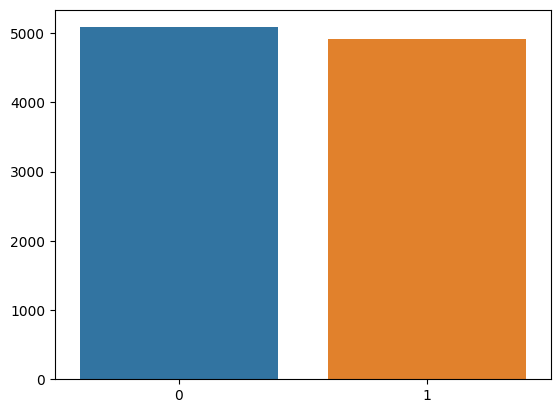

In [ ]:
sns.barplot(x=df['encoded_class'].value_counts().index, y=df['encoded_class'].value_counts().values)

In [ ]:
df = df.dropna()
df = df.drop_duplicates()

In [ ]:
df['class'].value_counts()

non-suicide    5085
suicide        4915
Name: class, dtype: int64

In [ ]:
df.head()

,text,class,encoded_class
0,Ex Wife Threatening SuicideRecently I left my ...,suicide,1
1,Am I weird I don't get affected by compliments...,non-suicide,0
2,Finally 2020 is almost over... So I can never ...,non-suicide,0
3,i need helpjust help me im crying so hard,suicide,1
4,"I’m so lostHello, my name is Adam (16) and I’v...",suicide,1


# **Tokenization**

### **Razdel**

In [ ]:
!pip install razdel

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
%%time

from razdel import tokenize
tokenized_texts = [list(tokenize(text)) for text in texts]
final_tokenized_texts = []
for tokenized_text in tokenized_texts:
    token_texts = []
    token_texts.extend([token.text for token in tokenized_text])
    final_tokenized_texts.append(token_texts)
# final_tokenized_texts

CPU times: user 2.36 s, sys: 5.17 ms, total: 2.36 s
Wall time: 2.5 s


[['Ex',
  'Wife',
  'Threatening',
  'SuicideRecently',
  'I',
  'left',
  'my',
  'wife',
  'for',
  'good',
  'because',
  'she',
  'has',
  'cheated',
  'on',
  'me',
  'twice',
  'and',
  'lied',
  'to',
  'me',
  'so',
  'much',
  'that',
  'I',
  'have',
  'decided',
  'to',
  'refuse',
  'to',
  'go',
  'back',
  'to',
  'her',
  'As',
  'of',
  'a',
  'few',
  'days',
  'ago',
  'she',
  'began',
  'threatening',
  'suicide',
  'I',
  'have',
  'tirelessly',
  'spent',
  'these',
  'paat',
  'few',
  'days',
  'talking',
  'her',
  'out',
  'of',
  'it',
  'and',
  'she',
  'keeps',
  'hesitating',
  'because',
  'she',
  'wants',
  'to',
  'believe',
  'Ill',
  'come',
  'back',
  'I',
  'know',
  'a',
  'lot',
  'of',
  'people',
  'will',
  'threaten',
  'this',
  'in',
  'order',
  'to',
  'get',
  'their',
  'way',
  'but',
  'what',
  'happens',
  'if',
  'she',
  'really',
  'does',
  'What',
  'do',
  'I',
  'do',
  'and',
  'how',
  'am',
  'I',
  'supposed',
  'to',
 

### **Регулярные выражения**

In [ ]:
%%time

re_tokenized_texts = []
for text in texts:
  re_tokenized_texts.append(re.findall(r'\w+', text))
#re_tokenized_texts

CPU times: user 414 ms, sys: 46.8 ms, total: 461 ms
Wall time: 470 ms


In [ ]:
re_tokenized_texts

[['ex',
  'wife',
  'threatening',
  'suiciderecently',
  'i',
  'left',
  'my',
  'wife',
  'for',
  'good',
  'because',
  'she',
  'has',
  'cheated',
  'on',
  'me',
  'twice',
  'and',
  'lied',
  'to',
  'me',
  'so',
  'much',
  'that',
  'i',
  'have',
  'decided',
  'to',
  'refuse',
  'to',
  'go',
  'back',
  'to',
  'her',
  'as',
  'of',
  'a',
  'few',
  'days',
  'ago',
  'she',
  'began',
  'threatening',
  'suicide',
  'i',
  'have',
  'tirelessly',
  'spent',
  'these',
  'paat',
  'few',
  'days',
  'talking',
  'her',
  'out',
  'of',
  'it',
  'and',
  'she',
  'keeps',
  'hesitating',
  'because',
  'she',
  'wants',
  'to',
  'believe',
  'ill',
  'come',
  'back',
  'i',
  'know',
  'a',
  'lot',
  'of',
  'people',
  'will',
  'threaten',
  'this',
  'in',
  'order',
  'to',
  'get',
  'their',
  'way',
  'but',
  'what',
  'happens',
  'if',
  'she',
  'really',
  'does',
  'what',
  'do',
  'i',
  'do',
  'and',
  'how',
  'am',
  'i',
  'supposed',
  'to',
 

### **Bert**

In [ ]:
!pip install transformers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 40.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 236.8/236.8 kB 24.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 90.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 69.3 MB/s eta 0:00:00


In [ ]:
from transformers import BertTokenizer
tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")

In [ ]:
%%time

bert_tokenized_texts = []
for text in texts:
  bert_tokenized_texts.append(tokenizer.tokenize(text))

CPU times: user 25.6 s, sys: 171 ms, total: 25.8 s
Wall time: 26 s


In [ ]:
bert_tokenized_texts

[['ex',
  'wife',
  'threatening',
  'suicide',
  '##re',
  '##cent',
  '##ly',
  'i',
  'left',
  'my',
  'wife',
  'for',
  'good',
  'because',
  'she',
  'has',
  'cheated',
  'on',
  'me',
  'twice',
  'and',
  'lied',
  'to',
  'me',
  'so',
  'much',
  'that',
  'i',
  'have',
  'decided',
  'to',
  'refuse',
  'to',
  'go',
  'back',
  'to',
  'her',
  'as',
  'of',
  'a',
  'few',
  'days',
  'ago',
  'she',
  'began',
  'threatening',
  'suicide',
  'i',
  'have',
  'tire',
  '##lessly',
  'spent',
  'these',
  'pa',
  '##at',
  'few',
  'days',
  'talking',
  'her',
  'out',
  'of',
  'it',
  'and',
  'she',
  'keeps',
  'he',
  '##sit',
  '##ating',
  'because',
  'she',
  'wants',
  'to',
  'believe',
  'ill',
  'come',
  'back',
  'i',
  'know',
  'a',
  'lot',
  'of',
  'people',
  'will',
  'threaten',
  'this',
  'in',
  'order',
  'to',
  'get',
  'their',
  'way',
  'but',
  'what',
  'happens',
  'if',
  'she',
  'really',
  'does',
  'what',
  'do',
  'i',
  'do',


### **NLTK Tokenization**

In [ ]:
import nltk
nltk.download('punkt')
nltk.download('stopwords')
from nltk.corpus import stopwords
stop_words = stopwords.words('english')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
def remove_punctuation(tokenized_texts: list) -> list:
    filtered_texts = []
    for tokenized_text in tokenized_texts:
        filtered_texts.append([re.sub(r"[^0-9A-Za-z]", "", token) for token in tokenized_text if re.sub(r"[^0-9A-Za-z]", "", token).strip()])
    return filtered_texts

In [ ]:
def clean_stopwords(tokenized_texts: list) -> list:
    filtered_texts = []
    for tokenized_text in tokenized_texts:
        filtered_texts.append([word for word in tokenized_text if word.lower() not in [*stop_words, 'im']])
    return filtered_texts

In [ ]:
%%time
tokenized_texts = []
for text in texts:
  tokenized_texts.append(nltk.word_tokenize(text))

CPU times: user 15.5 s, sys: 101 ms, total: 15.6 s
Wall time: 21.7 s


In [ ]:
tokenized_texts = remove_punctuation(tokenized_texts)
tokenized_texts = clean_stopwords(tokenized_texts)

In [ ]:
for text in tokenized_texts[:10]:
  print(text)

['ex', 'wife', 'threatening', 'suiciderecently', 'left', 'wife', 'good', 'cheated', 'twice', 'lied', 'much', 'decided', 'refuse', 'go', 'back', 'days', 'ago', 'began', 'threatening', 'suicide', 'tirelessly', 'spent', 'paat', 'days', 'talking', 'keeps', 'hesitating', 'wants', 'believe', 'come', 'back', 'know', 'lot', 'people', 'threaten', 'order', 'get', 'way', 'happens', 'really', 'supposed', 'handle', 'death', 'hands', 'still', 'love', 'wife', 'deal', 'getting', 'cheated', 'constantly', 'feeling', 'insecure', 'worried', 'today', 'may', 'day', 'hope', 'much', 'happen']
['weird', 'get', 'affected', 'compliments', 'coming', 'someone', 'know', 'irl', 'feel', 'really', 'good', 'internet', 'strangers']
['finally', '2020', 'almost', 'never', 'hear', '2020', 'bad', 'year', 'ever', 'swear', 'fucking', 'god', 'annoying']
['need', 'helpjust', 'help', 'crying', 'hard']
['losthello', 'name', 'adam', '16', 'struggling', 'years', 'afraid', 'past', 'years', 'thoughts', 'suicide', 'fear', 'anxiety', '

# **Lemmatization**

### **Lemmatization with NLTK**

In [ ]:
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [ ]:
%%time
from nltk import word_tokenize, pos_tag
from nltk.stem import WordNetLemmatizer
wnl = WordNetLemmatizer()
lemmatized_texts_wo_punct = []
for clean_tokenized_text in tokenized_texts:
  lemmatized_texts_wo_punct.append([wnl.lemmatize(i,j[0].lower()) if j[0].lower() in ['a','n','v'] else wnl.lemmatize(i) for i,j in pos_tag(clean_tokenized_text)])

CPU times: user 43.7 s, sys: 372 ms, total: 44 s
Wall time: 44.4 s


In [ ]:
lemmatized_texts_wo_punct = clean_stopwords(lemmatized_texts_wo_punct)
lemmatized_texts_wo_punct = [' '.join(text) for text in lemmatized_texts_wo_punct]
print(lemmatized_texts_wo_punct[:10])

['ex wife threaten suiciderecently leave wife good cheat twice lie much decide refuse go back day ago begin threaten suicide tirelessly spent paat day talk keep hesitating want believe come back know lot people threaten order get way happens really suppose handle death hand still love wife deal get cheat constantly feeling insecure worry today may day hope much happen', 'weird get affect compliment come someone know irl feel really good internet stranger', 'finally 2020 almost never hear 2020 bad year ever swear fuck god annoy', 'need helpjust help cry hard', 'losthello name adam 16 struggle year afraid past year thought suicide fear anxiety close limit quiet long scar come family feeling 3 year ago lose aunt trigger everyday feeling hopeless lose guilty remorseful thing life thought like little experienced life time reveal feeling family break saw cut watch get worried something portrayed average day make feel absolutely dreadful later find attempt survivor attempt od overdose pill at

In [ ]:
df['lemmatized_texts'] = [text for text in lemmatized_texts_wo_punct]
df.head()

,text,class,encoded_class,lemmatized_texts
0,Ex Wife Threatening SuicideRecently I left my ...,suicide,1,ex wife threaten suiciderecently leave wife go...
1,Am I weird I don't get affected by compliments...,non-suicide,0,weird get affect compliment come someone know ...
2,Finally 2020 is almost over... So I can never ...,non-suicide,0,finally 2020 almost never hear 2020 bad year e...
3,i need helpjust help me im crying so hard,suicide,1,need helpjust help cry hard
4,"I’m so lostHello, my name is Adam (16) and I’v...",suicide,1,losthello name adam 16 struggle year afraid pa...


### **Lemmatization with Simplemma**

In [ ]:
!pip install simplemma

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.5/75.5 MB 7.4 MB/s eta 0:00:00


In [ ]:
import simplemma
from simplemma import text_lemmatizer

In [ ]:
%%time
simplemma_lemmatized_texts = []
for clean_tokenized_text in tokenized_texts:
  simplemma_lemmatized_text = []
  for clean_token in clean_tokenized_text:
    simplemma_lemmatized_text.append(simplemma.lemmatize(clean_token, lang='en'))
  simplemma_lemmatized_texts.append(simplemma_lemmatized_text)

CPU times: user 2.06 s, sys: 33.6 ms, total: 2.09 s
Wall time: 4.5 s


In [ ]:
for text in simplemma_lemmatized_texts[:10]:
  print(text)

Streaming output truncated to the last 5000 lines.
['hair', 'eye', 'good', 'like', 'people', 'tell', 'ugly', 'add', 'emo', 'ascetic', 'make', 'look', 'slightly', 'hotter', 'still', 'see', 'downside']
['girl', 'transformer', 'youd', 'optimus', 'fine', 'filler', 'filler', 'filler', 'filler', 'filler', 'filler', 'filler', 'filler', 'filler', 'filler', 'filler', 'filler', 'filler', 'filler', 'filler', 'filler', 'filler', 'filler', 'filler', 'filler', 'filler', 'filler', 'bitch']
['perfect', 'excuse', 'sit', 'play', 'game', 'day', 'today', 'doctor', 'tell', 'something', 'eye', 'might', 'make', 'go', 'blind', 'much', 'physical', 'activity', 'win']
['would', 'rather', 'work', 'stressful', 'highpaying', 'job', 'work', '23', 'chill', 'job', 'pay', 'less', 'bottom', 'line', 'need', 'make', 'less', '2000', 'month', 'get', 'offer', 'interview', 'new', 'luxury', 'restaurant', 'thinke', 'feel', 'like', 'prefer', 'lay', 'back', 'workspace', 'since', 'highend', 'job', 'tend', 'full', 'customerscoworke

### **Lemmatization with Spacy**

In [ ]:
import spacy
nlp = spacy.load('en_core_web_sm', disable = ['parser', 'ner'])

In [ ]:
%%time
all_lemmatized_texts = []
for tokenized_text in tokenized_texts:
  sentence = ' '.join(tokenized_text)
  doc = nlp(sentence)
  lemmatized_text = [token.lemma_ for token in doc]
  all_lemmatized_texts.append(lemmatized_text)

CPU times: user 2min 9s, sys: 513 ms, total: 2min 9s
Wall time: 2min 21s


[['ex',
  'wife',
  'threaten',
  'suiciderecently',
  'I',
  'leave',
  'my',
  'wife',
  'for',
  'good',
  'because',
  'she',
  'have',
  'cheat',
  'on',
  'I',
  'twice',
  'and',
  'lie',
  'to',
  'I',
  'so',
  'much',
  'that',
  'I',
  'have',
  'decide',
  'to',
  'refuse',
  'to',
  'go',
  'back',
  'to',
  'she',
  'as',
  'of',
  'a',
  'few',
  'day',
  'ago',
  'she',
  'begin',
  'threaten',
  'suicide',
  'I',
  'have',
  'tirelessly',
  'spend',
  'these',
  'paat',
  'few',
  'day',
  'talk',
  'she',
  'out',
  'of',
  'it',
  'and',
  'she',
  'keep',
  'hesitate',
  'because',
  'she',
  'want',
  'to',
  'believe',
  'ill',
  'come',
  'back',
  'I',
  'know',
  'a',
  'lot',
  'of',
  'people',
  'will',
  'threaten',
  'this',
  'in',
  'order',
  'to',
  'get',
  'their',
  'way',
  'but',
  'what',
  'happen',
  'if',
  'she',
  'really',
  'do',
  'what',
  'do',
  'I',
  'do',
  'and',
  'how',
  'be',
  'I',
  'suppose',
  'to',
  'handle',
  'her',
  '

In [ ]:
lemmatized_texts_result = []
for inside_list in all_lemmatized_texts:
  lemmatized_texts_result.append(' '.join(inside_list))
lemmatized_texts_result[:5]

['ex wife threaten suiciderecently leave wife good cheat twice lie much decide refuse go back day ago begin threaten suicide tirelessly spend paat day talk keep hesitate want believe ill come back know lot people threaten order get way happen really suppose handle death hand still love wife deal get cheat constantly feel insecure I m worried today may day hope much do not happen',
 'weird do not get affect compliment come someone know irl feel really good internet stranger',
 'finally 2020 almost never hear 2020 bad year ever swear fucking god annoying',
 'need helpjust help I m cry hard',
 'I m losthello name adam 16 I ve struggle year I m afraid past year thought suicide fear anxiety I m close limit I ve quiet long I m scared come family feeling 3 year ago lose aunt trigger everyday feel hopeless lose guilty remorseful thing I ve do lifebut thought like little I ve experience life time I ve reveal feeling family break see cut watch get worry something portray average day make feel ab

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    lemmatized_texts_wo_punct,
    labels,
    test_size=0.2,
    random_state=1,
)

In [ ]:
X_test[:5]

['dream straight friend push wall choke normal right',
 'envyi hear three people friends friend die past week woman 40 unexpected natural cause think cant lucky people want live enjoy life offer die stuck living dont want',
 'fail everythingfor realize suicide probably best option paralyze fear failing think ever successful life fail would probably mean family would find made fun self harm anything tell feel suicidal two year ago fail afraid make angry feel like already inconvenience people love afraid make feel like worry stress much depress want make feel like need stress even debate sort method afraid inconvenience even death like want anyone find want make mess either way kill involve either guess always afraid purpose right hop one day soon self harm bad enough accident scar future especially never able something love living good enough art get school people age capable much create work much mean depth skill hate everything create never successful anything art living idea fuck lov

In [ ]:
print(f'len(X_train) = {len(X_train)}')
print(f'len(y_train) = {len(y_train)}')
print(f'len(X_test) = {len(X_test)}')
print(f'len(y_test) = {len(y_test)}')

len(X_train) = 8000
len(y_train) = 8000
len(X_test) = 2000
len(y_test) = 2000


### **CountVectorizer**

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

In [ ]:
%%time
c_vect_first = CountVectorizer(max_features=50)
X_train_bow_first = c_vect_first.fit_transform(X_train)
X_test_bow_first = c_vect_first.transform(X_test)

CPU times: user 699 ms, sys: 9.45 ms, total: 709 ms
Wall time: 1.32 s


In [ ]:
%%time
c_vect_second = CountVectorizer(max_features=100)
X_train_bow_second = c_vect_second.fit_transform(X_train)
X_test_bow_second = c_vect_second.transform(X_test)

CPU times: user 554 ms, sys: 6.88 ms, total: 561 ms
Wall time: 566 ms


In [ ]:
%%time
c_vect_third = CountVectorizer(max_features=300)
X_train_bow_third = c_vect_third.fit_transform(X_train)
X_test_bow_third = c_vect_third.transform(X_test)

CPU times: user 553 ms, sys: 4.97 ms, total: 558 ms
Wall time: 567 ms


In [ ]:
%%time
c_vect_fourth = CountVectorizer(max_features=500)
X_train_bow_fourth = c_vect_fourth.fit_transform(X_train)
X_test_bow_fourth = c_vect_fourth.transform(X_test)

CPU times: user 569 ms, sys: 6.94 ms, total: 576 ms
Wall time: 582 ms


In [ ]:
%%time
c_vect_fifth = CountVectorizer(max_features=300, ngram_range = (1, 2))
X_train_bow_fifth = c_vect_fifth.fit_transform(X_train)
X_test_bow_fifth = c_vect_fifth.transform(X_test)

CPU times: user 2.2 s, sys: 69.8 ms, total: 2.27 s
Wall time: 2.29 s


In [ ]:
%%time
c_vect_sixth = CountVectorizer(max_features=300, ngram_range = (1, 3))
X_train_bow_sixth = c_vect_sixth.fit_transform(X_train)
X_test_bow_sixth = c_vect_sixth.transform(X_test)

CPU times: user 4.98 s, sys: 404 ms, total: 5.39 s
Wall time: 5.42 s


In [ ]:
from sklearn.preprocessing import StandardScaler

stand_scaler = StandardScaler(with_mean=False)

In [ ]:
x_train_third_standardized = stand_scaler.fit_transform(X_train_bow_third)
x_test_third_standardized = stand_scaler.fit_transform(X_test_bow_third)

In [ ]:
x_train_fifth_standardized = stand_scaler.fit_transform(X_train_bow_fifth)
x_test_fifth_standardized = stand_scaler.fit_transform(X_test_bow_fifth)

In [ ]:
x_train_sixth_standardized = stand_scaler.fit_transform(X_train_bow_sixth)
x_test_sixth_standardized = stand_scaler.fit_transform(X_test_bow_sixth)

## **Modeling**

### **Sentence Transformer**

In [ ]:
!pip install -U sentence-transformers

In [ ]:
from sentence_transformers import SentenceTransformer

model_st = SentenceTransformer('all-MiniLM-L6-v2')

In [ ]:
X_train_emb = model_st.encode(X_train)
X_test_emb = model_st.encode(X_test)

In [ ]:
param_grid_knn = {'n_neighbors':[3,5,7],
              'weights':["uniform", 'distance'],
              'metric':['minkowski','cosine', 'euclidean','cityblock']}
grid_model_knn = GridSearchCV(KNeighborsClassifier(), param_grid, refit = True, verbose=3)

In [ ]:
grid_model_knn.fit(X_train_emb, y_train)
pred_grid_sixth = grid_model_knn.predict(X_test_emb)
print(grid_model_knn.best_params_)

Fitting 5 folds for each of 24 candidates, totalling 120 fits
[CV 1/5] END metric=minkowski, n_neighbors=3, weights=uniform;, score=0.874 total time=   0.3s
[CV 2/5] END metric=minkowski, n_neighbors=3, weights=uniform;, score=0.867 total time=   0.3s
[CV 3/5] END metric=minkowski, n_neighbors=3, weights=uniform;, score=0.863 total time=   0.3s
[CV 4/5] END metric=minkowski, n_neighbors=3, weights=uniform;, score=0.865 total time=   0.2s
[CV 5/5] END metric=minkowski, n_neighbors=3, weights=uniform;, score=0.874 total time=   0.3s
[CV 1/5] END metric=minkowski, n_neighbors=3, weights=distance;, score=0.874 total time=   0.2s
[CV 2/5] END metric=minkowski, n_neighbors=3, weights=distance;, score=0.867 total time=   0.2s
[CV 3/5] END metric=minkowski, n_neighbors=3, weights=distance;, score=0.863 total time=   0.2s
[CV 4/5] END metric=minkowski, n_neighbors=3, weights=distance;, score=0.865 total time=   0.2s
[CV 5/5] END metric=minkowski, n_neighbors=3, weights=distance;, score=0.874 to

In [ ]:
knn = KNeighborsClassifier(
    n_neighbors = 5,
    weights = 'distance',
    metric = 'cityblock'
)
knn.fit(X_train_emb, y_train)

predicted = knn.predict(X_test_emb)
print(classification_report(y_test , predicted))

              precision    recall  f1-score   support

           0       0.96      0.80      0.87       999
           1       0.83      0.97      0.89      1001

    accuracy                           0.88      2000
   macro avg       0.90      0.88      0.88      2000
weighted avg       0.89      0.88      0.88      2000



In [ ]:
logreg = LogisticRegression(random_state=1)
logreg.fit(X_train_emb, y_train)

logreg_predicted = logreg.predict(X_test_emb)
print(classification_report(y_test, logreg_predicted))

              precision    recall  f1-score   support

           0       0.91      0.94      0.93       999
           1       0.94      0.91      0.92      1001

    accuracy                           0.92      2000
   macro avg       0.93      0.92      0.92      2000
weighted avg       0.93      0.92      0.92      2000



In [ ]:
linear_csv_params = {
    "C": [0.1, 1, 10], "dual": [False], "penalty": ["l1", "l2"]
}

linear_csv_sentence_transformer_grid_model = GridSearchCV(LinearSVC(), linear_csv_params, refit=True, verbose=3)
linear_csv_sentence_transformer_grid_model.fit(X_train_emb, y_train)
print(linear_csv_sentence_transformer_grid_model.best_estimator_, linear_csv_sentence_transformer_grid_model.best_score_)

Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV 1/5] END .....C=0.1, dual=False, penalty=l1;, score=0.909 total time=   2.8s
[CV 2/5] END .....C=0.1, dual=False, penalty=l1;, score=0.902 total time=   2.4s
[CV 3/5] END .....C=0.1, dual=False, penalty=l1;, score=0.911 total time=   2.1s
[CV 4/5] END .....C=0.1, dual=False, penalty=l1;, score=0.910 total time=   3.1s
[CV 5/5] END .....C=0.1, dual=False, penalty=l1;, score=0.894 total time=   3.6s
[CV 1/5] END .....C=0.1, dual=False, penalty=l2;, score=0.914 total time=   0.5s
[CV 2/5] END .....C=0.1, dual=False, penalty=l2;, score=0.910 total time=   0.5s
[CV 3/5] END .....C=0.1, dual=False, penalty=l2;, score=0.921 total time=   0.5s
[CV 4/5] END .....C=0.1, dual=False, penalty=l2;, score=0.916 total time=   0.3s
[CV 5/5] END .....C=0.1, dual=False, penalty=l2;, score=0.902 total time=   0.3s
[CV 1/5] END .......C=1, dual=False, penalty=l1;, score=0.909 total time=  18.2s
[CV 2/5] END .......C=1, dual=False, penalty=l1;,

In [ ]:
linear_svc_sentence_transformer = LinearSVC(C=0.1, penalty="l2", dual=False, max_iter=20000)
linear_svc.fit(X_train_emb, y_train)
print(classification_report(y_test, linear_svc.predict(X_test_emb)))

              precision    recall  f1-score   support

           0       0.90      0.94      0.92       999
           1       0.93      0.90      0.91      1001

    accuracy                           0.92      2000
   macro avg       0.92      0.92      0.92      2000
weighted avg       0.92      0.92      0.92      2000



In [ ]:
lemmatized_suicide_texts = []

for index, row in df.iterrows():
    if row['encoded_class'] == 1:
        lemmatized_suicide_texts.append(row["lemmatized_texts"])

In [ ]:
lemmatized_suicide_texts[:5]

['ex wife threaten suiciderecently leave wife good cheat twice lie much decide refuse go back day ago begin threaten suicide tirelessly spent paat day talk keep hesitating want believe come back know lot people threaten order get way happens really suppose handle death hand still love wife deal get cheat constantly feeling insecure worry today may day hope much happen',
 'need helpjust help cry hard',
 'losthello name adam 16 struggle year afraid past year thought suicide fear anxiety close limit quiet long scar come family feeling 3 year ago lose aunt trigger everyday feeling hopeless lose guilty remorseful thing life thought like little experienced life time reveal feeling family break saw cut watch get worried something portrayed average day make feel absolutely dreadful later find attempt survivor attempt od overdose pill attempt hang happen blackout pill never go noose still afraid first therapy diagnose severe depression social anxiety eat disorder later transfer fucken group the

# **Topic Modeling**

### **Vectorization**

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [ ]:
tfifd_vectorizer = TfidfVectorizer(
    max_df=0.95, min_df=2, max_features=500
)
tfidf = tfifd_vectorizer.fit_transform(lemmatized_suicide_texts)

### **Vocabulary**

In [ ]:
vocab = tfifd_vectorizer.get_feature_names_out()
vocab

array(['10', '15', '18', '20', 'able', 'absolutely', 'abuse', 'abusive',
       'accept', 'act', 'actually', 'advice', 'afraid', 'age', 'ago',
       'alive', 'allow', 'almost', 'alone', 'already', 'also', 'always',
       'amount', 'amp', 'angry', 'another', 'answer', 'anxiety',
       'anymore', 'anyone', 'anything', 'anyway', 'anyways', 'around',
       'ask', 'attempt', 'attention', 'away', 'awful', 'back', 'bad',
       'barely', 'basically', 'bear', 'become', 'bed', 'begin', 'behind',
       'believe', 'best', 'better', 'big', 'birthday', 'bit', 'blame',
       'body', 'bother', 'boyfriend', 'brain', 'break', 'bring',
       'brother', 'bully', 'burden', 'buy', 'call', 'cant', 'car', 'care',
       'cause', 'chance', 'change', 'child', 'class', 'close', 'college',
       'come', 'commit', 'complete', 'completely', 'consider', 'constant',
       'constantly', 'continue', 'control', 'could', 'country', 'couple',
       'course', 'cry', 'currently', 'cut', 'dad', 'date', 'day', 'dea

## **NMF**

In [ ]:
from sklearn.decomposition import NMF
nmf_tfidf_20 = NMF(n_components=20, random_state=seed, max_iter=500).fit(tfidf)
nmf_tfidf_20.reconstruction_err_

60.8814261998139

In [ ]:
%%time
nmf_tfidf_40 = NMF(n_components=40, random_state=seed, max_iter=500).fit(tfidf)

CPU times: user 5.86 s, sys: 162 ms, total: 6.02 s
Wall time: 6.05 s


In [ ]:
nmf_tfidf.reconstruction_err_

54.218192791575206

In [ ]:
def get_topics(components, vocab, topn=5):
  topic_words = []

  for i, component in enumerate(components):
    term_comp = zip(vocab, component)
    sorted_terms = sorted(term_comp, key=lambda x: x[-1], reverse=True)[:topn]
    topic_words.append([j[0] for j in sorted_terms])
  return topic_words

In [ ]:
def print_topics(components, vocab, topn=15):
  topics = get_topics(components, vocab, topn=topn)
  for index, topic in enumerate(topics):
    print(index, topic)

In [ ]:
from sklearn.decomposition import NMF
nmf_tfidf_30 = NMF(n_components=30, random_state=seed, max_iter=500).fit(tfidf)

In [ ]:
nmf_tfidf_10 = NMF(n_components=10, random_state=seed, max_iter=500).fit(tfidf)

In [ ]:
nmf_tfidf_6 = NMF(n_components=6, random_state=seed, max_iter=500).fit(tfidf)

### **Key words for each topic**

In [ ]:
print_topics(nmf_tfidf_6.components_, vocab, topn=40)

0 ['get', 'go', 'year', 'time', 'work', 'job', 'day', 'school', 'try', 'tell', 'back', 'take', 'last', 'month', 'start', 'friend', 'even', 'make', 'since', 'thing', 'week', 'think', 'say', 'never', 'ago', 'home', 'depression', 'parent', 'really', 'one', 'keep', 'still', 'leave', 'come', 'know', 'find', 'college', 'every', 'worse', 'away']
1 ['want', 'die', 'kill', 'anymore', 'dont', 'go', 'pain', 'know', 'hurt', 'live', 'stop', 'take', 'end', 'hate', 'tire', 'cant', 'really', 'scar', 'exist', 'wake', 'sleep', 'dead', 'get', 'anything', 'keep', 'leave', 'nothing', 'alive', 'idk', 'alone', 'much', 'everything', 'break', 'family', 'sick', 'already', 'away', 'happy', 'suffer', 'try']
2 ['fuck', 'shit', 'na', 'hate', 'fucking', 'wan', 'gon', 'everything', 'cant', 'give', 'dont', 'everyone', 'kill', 'life', 'sick', 'die', 'even', 'deserve', 'get', 'stupid', 'god', 'go', 'literally', 'nothing', 'mom', 'piece', 'like', 'tire', 'hurt', 'wish', 'brain', 'never', 'better', 'useless', 'ever', 'els

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
print_topics(nmf_tfidf_30.components_, vocab, topn=40)

0 ['know', 'even', 'post', 'sorry', 'good', 'write', 'way', 'right', 'long', 'point', 'probably', 'honestly', 'anything', 'happen', 'scar', 'wrong', 'look', 'kind', 'sound', 'lose', 'thing', 'maybe', 'able', 'without', 'though', 'fact', 'reason', 'place', 'attention', 'else', 'stay', 'could', 'completely', 'afraid', 'plan', 'sure', 'support', 'feeling', 'person', 'still']
1 ['want', 'stop', 'hurt', 'pain', 'exist', 'end', 'scar', 'alone', 'happy', 'break', 'anything', 'someone', 'live', 'sick', 'idk', 'wake', 'tire', 'okay', 'nothing', 'much', 'miserable', 'see', 'deal', 'therapy', 'anymore', 'depress', 'hear', 'jump', 'burden', 'suffer', 'free', 'leave', 'minute', 'worry', 'drive', 'body', 'away', 'watch', 'shitty', 'another']
2 ['fuck', 'shit', 'fucking', 'give', 'stupid', 'sick', 'everything', 'literally', 'deserve', 'even', 'god', 'everyone', 'piece', 'ever', 'brain', 'like', 'head', 'cant', 'useless', 'stop', 'man', 'hurt', 'shitty', 'nothing', 'bear', 'pull', 'ugly', 'right', 'bo

In [ ]:
print_topics(nmf_tfidf_20.components_, vocab, topn=40)

0 ['year', 'friend', 'school', 'time', 'never', 'parent', 'tell', 'start', 'since', 'old', 'month', 'family', 'mom', 'job', 'move', 'depression', 'college', 'dad', 'ago', 'make', 'work', 'girl', 'love', 'back', 'always', 'high', 'come', 'leave', 'last', 'week', 'first', 'one', 'also', 'mother', 'new', 'say', 'two', 'anxiety', 'relationship', 'lose']
1 ['want', 'die', 'stop', 'hurt', 'exist', 'live', 'pain', 'tire', 'leave', 'scar', 'happy', 'end', 'idk', 'alone', 'break', 'someone', 'wake', 'hear', 'mom', 'sick', 'suffer', 'free', 'nothing', 'anything', 'jump', 'minute', 'dead', 'body', 'stay', 'let', 'see', 'mind', 'miserable', 'okay', 'afraid', 'burden', 'death', 'world', 'alive', 'therapy']
2 ['fuck', 'shit', 'fucking', 'give', 'stupid', 'everything', 'sick', 'deserve', 'literally', 'even', 'god', 'everyone', 'piece', 'ever', 'stop', 'brain', 'mom', 'like', 'head', 'hurt', 'never', 'cant', 'die', 'useless', 'man', 'right', 'shitty', 'nothing', 'wish', 'bear', 'bother', 'ugly', 'pull

In [ ]:
print_topics(nmf_tfidf_10.components_, vocab, topn=40)

0 ['get', 'go', 'year', 'time', 'work', 'job', 'school', 'back', 'try', 'day', 'month', 'start', 'take', 'last', 'even', 'tell', 'since', 'make', 'home', 'week', 'friend', 'never', 'ago', 'depression', 'parent', 'thing', 'college', 'worse', 'still', 'away', 'leave', 'keep', 'mom', 'dad', 'move', 'find', 'hour', 'come', 'money', 'first']
1 ['want', 'die', 'kill', 'anymore', 'hurt', 'go', 'stop', 'pain', 'hate', 'take', 'tire', 'know', 'exist', 'live', 'scar', 'really', 'wake', 'sleep', 'end', 'get', 'leave', 'alone', 'dead', 'much', 'break', 'anything', 'sick', 'idk', 'keep', 'someone', 'alive', 'away', 'let', 'everything', 'mom', 'body', 'happy', 'nothing', 'afraid', 'try']
2 ['fuck', 'shit', 'hate', 'fucking', 'everything', 'give', 'sick', 'stupid', 'everyone', 'deserve', 'even', 'god', 'literally', 'die', 'go', 'piece', 'kill', 'mom', 'like', 'hurt', 'brain', 'wish', 'cant', 'stop', 'head', 'get', 'ever', 'useless', 'nothing', 'never', 'school', 'ugly', 'better', 'else', 'worthless',

In [ ]:
new_features_tfidf = nmf_tfidf_20.transform(tfidf)
new_features_tfidf

array([[6.07962667e-03, 1.22659498e-02, 0.00000000e+00, ...,
        1.25441964e-02, 2.90896715e-02, 4.02711808e-03],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        4.47075708e-03, 4.62835625e-03, 1.12079818e-03],
       [4.06258539e-02, 1.40388956e-03, 0.00000000e+00, ...,
        4.71655913e-02, 2.79594908e-03, 0.00000000e+00],
       ...,
       [0.00000000e+00, 1.97213832e-02, 0.00000000e+00, ...,
        0.00000000e+00, 1.99282149e-05, 5.84000661e-03],
       [2.14901817e-04, 8.95355679e-02, 1.97229729e-03, ...,
        0.00000000e+00, 8.73545303e-03, 0.00000000e+00],
       [6.19657363e-03, 4.94215641e-02, 8.16410001e-02, ...,
        7.61507863e-03, 1.64759183e-03, 0.00000000e+00]])

In [ ]:
new_features_tfidf.shape

(4915, 20)

In [ ]:
lemmatized_suicide_texts[300]

'welpi never felt close go thru week last straw afraid get worse worse feel like depressed anxious bc life great still feel like go one friend also depress reason shitty childhood drug texted couple day ago say close go thru texted bit suddenly stop check since help think actually go thru even tve give shit people say go right never end abyss'

In [ ]:
new_features_tfidf[300]

array([0.02079005, 0.00022415, 0.00744246, 0.07466481, 0.01905005,
       0.02088343, 0.        , 0.00225755, 0.        , 0.        ,
       0.03114419, 0.02722118, 0.00342984, 0.        , 0.0249405 ,
       0.10449749, 0.02906987, 0.        , 0.01292451, 0.        ])

In [ ]:
np.argmax(new_features_tfidf[300])

15

In [ ]:
np.argsort(new_features_tfidf[300])

array([ 9, 17, 13,  8,  6, 19,  1,  7, 12,  2, 18,  4,  0,  5, 14, 11, 16,
       10,  3, 15])

## **LDA**

In [ ]:
from sklearn.decomposition import LatentDirichletAllocation

In [ ]:
%%time
lda_5 = LatentDirichletAllocation(
    n_components=5,
    max_iter=500,
    random_state=seed
)
lda_5.fit(tfidf)

CPU times: user 7min 20s, sys: 1.1 s, total: 7min 21s
Wall time: 7min 27s


LatentDirichletAllocation(max_iter=500, n_components=5, random_state=1)

In [ ]:
%%time
lda_10 = LatentDirichletAllocation(
    n_components=10,
    max_iter=500,
    random_state=seed
)
lda_10.fit(tfidf)

CPU times: user 5min 52s, sys: 929 ms, total: 5min 53s
Wall time: 6min 2s


LatentDirichletAllocation(max_iter=500, random_state=1)

In [ ]:
%%time
lda_15 = LatentDirichletAllocation(
    n_components=15,
    max_iter=500,
    random_state=seed
)
lda_15.fit(tfidf)

CPU times: user 5min 33s, sys: 867 ms, total: 5min 34s
Wall time: 5min 37s


LatentDirichletAllocation(max_iter=500, n_components=15, random_state=1)

In [ ]:
lda_features = lda_20.transform(tfidf)

In [ ]:

%%time
lda_20 = LatentDirichletAllocation(
    n_components=20,
    max_iter=500,
    random_state=seed
)
lda_20.fit(tfidf)

CPU times: user 5min 25s, sys: 850 ms, total: 5min 26s
Wall time: 5min 34s


LatentDirichletAllocation(max_iter=500, n_components=20, random_state=1)

In [ ]:
%%time
lda_30 = LatentDirichletAllocation(
    n_components=30,
    max_iter=500,
    random_state=seed
)
lda_30.fit(tfidf)

CPU times: user 5min 43s, sys: 1.07 s, total: 5min 44s
Wall time: 5min 48s


LatentDirichletAllocation(max_iter=500, n_components=30, random_state=1)

In [ ]:
%%time
lda_40 = LatentDirichletAllocation(
    n_components=40,
    max_iter=500,
    random_state=seed
)
lda_40.fit(tfidf)

CPU times: user 5min 40s, sys: 1.06 s, total: 5min 41s
Wall time: 5min 46s


LatentDirichletAllocation(max_iter=500, n_components=40, random_state=1)

In [ ]:
print_topics(lda_30.components_, vocab, 40)

0 ['want', 'feel', 'get', 'like', 'go', 'know', 'life', 'think', 'time', 'people', 'make', 'even', 'year', 'one', 'would']
1 ['jump', 'think', 'maybe', 'anyone', 'consider', 'front', 'take', 'night', 'lead', 'seriously', 'write', 'point', 'good', 'everyone', 'guess']
2 ['fuck', 'give', 'kill', 'reason', 'single', 'go', 'end', 'anymore', 'live', 'life', 'literally', 'want', 'medication', 'one', 'die']
3 ['matter', 'close', 'like', 'suicide', 'good', 'always', 'girl', 'people', 'story', 'tell', 'help', 'small', 'feeling', 'normal', 'friend']
4 ['hate', 'want', 'die', 'dont', 'fuck', 'cant', 'like', 'fucking', 'wake', 'feel', 'kill', 'let', 'everyone', 'god', 'deserve']
5 ['deserve', 'enough', 'burden', 'deep', 'exist', 'problem', 'amount', 'go', 'parent', 'job', 'currently', 'hop', 'else', 'find', 'dad']
6 ['gon', 'na', 'soon', 'free', 'kill', 'today', 'wonder', 'usually', 'ill', 'probably', 'eye', 'cry', 'hand', 'need', 'especially']
7 ['anyways', 'hand', 'show', 'survive', 'home', 'mee

In [ ]:
print_topics(lda_20.components_, vocab, 15)

0 ['get', 'want', 'feel', 'go', 'like', 'know', 'life', 'think', 'time', 'year', 'make', 'even', 'would', 'friend', 'one']
1 ['jump', 'post', 'front', 'cant', 'lie', 'minute', 'guy', 'sad', 'ok', 'ill', 'abuse', 'ive', 'never', 'bit', 'tell']
2 ['pill', 'take', 'goodbye', 'hate', 'soon', 'kill', 'enough', 'buy', 'sleep', 'die', 'much', 'everything', 'wake', 'morning', 'want']
3 ['worth', 'point', 'life', 'live', 'stay', 'death', 'lose', 'need', 'free', 'hand', 'love', 'die', 'want', 'nothing', 'good']
4 ['na', 'wan', 'gon', 'kill', 'least', 'cry', 'plz', 'talk', 'end', 'bear', 'text', 'right', 'god', 'ill', 'happen']
5 ['cut', 'message', 'new', 'think', 'deep', 'today', 'around', 'maybe', 'dad', 'sister', 'work', 'depress', 'anymore', 'mother', 'two']
6 ['fuck', 'mental', 'ever', 'bear', 'drop', 'literally', 'anyone', 'life', 'different', 'small', 'make', 'hope', 'say', 'health', 'come']
7 ['want', 'suicidal', 'alone', 'tire', 'thought', 'always', 'anymore', 'sick', 'die', 'feel', 'cur

In [ ]:
print_topics(lda_15.components_, lda_vocab, 15)

0 ['get', 'go', 'want', 'life', 'like', 'know', 'feel', 'year', 'think', 'school', 'even', 'time', 'job', 'friend', 'would']
1 ['want', 'feel', 'life', 'like', 'people', 'know', 'think', 'thing', 'make', 'get', 'go', 'would', 'live', 'even', 'one']
2 ['suicide', 'commit', 'want', 'wish', 'kill', 'like', 'end', 'reason', 'nothing', 'life', 'anymore', 'hate', 'worth', 'wake', 'seem']
3 ['fuck', 'dont', 'cant', 'want', 'die', 'hate', 'deserve', 'fucking', 'shit', 'everyone', 'ive', 'head', 'see', 'kill', 'drug']
4 ['would', 'always', 'suicide', 'better', 'matter', 'shit', 'suffer', 'lie', 'like', 'around', 'make', 'get', 'people', 'without', 'come']
5 ['world', 'lose', 'work', 'anymore', 'suppose', 'live', 'hope', 'point', 'give', 'ever', 'still', 'everything', 'fail', 'good', 'nothing']
6 ['need', 'please', 'someone', 'talk', 'anyone', 'help', 'way', 'want', 'really', 'best', 'know', 'right', 'kill', 'suicide', 'write']
7 ['sorry', 'cut', 'drive', 'watch', 'wrong', 'hear', 'scar', 'think

In [ ]:
print_topics(lda_10.components_, lda_vocab, 20)

0 ['get', 'go', 'want', 'like', 'life', 'feel', 'know', 'year', 'think', 'friend', 'time', 'never', 'even', 'make', 'would', 'one', 'school', 'job', 'work', 'tell']
1 ['feel', 'get', 'go', 'want', 'like', 'think', 'know', 'time', 'life', 'really', 'make', 'day', 'help', 'last', 'year', 'thought', 'even', 'thing', 'try', 'suicidal']
2 ['na', 'wan', 'gon', 'soon', 'kill', 'cry', 'god', 'probably', 'fight', 'end', 'cause', 'even', 'friend', 'class', 'two', 'pay', 'ive', 'father', 'later', 'happy']
3 ['fuck', 'dont', 'cant', 'want', 'hate', 'die', 'shit', 'kill', 'deserve', 'fucking', 'give', 'like', 'everyone', 'life', 'live', 'anymore', 'ive', 'always', 'sick', 'reason']
4 ['suicide', 'want', 'know', 'help', 'would', 'like', 'commit', 'people', 'kill', 'post', 'say', 'way', 'think', 'feel', 'make', 'tell', 'friend', 'really', 'ask', 'go']
5 ['sorry', 'today', 'anymore', 'feel', 'happen', 'around', 'world', 'something', 'depress', 'able', 'end', 'maybe', 'die', 'want', 'hour', 'think', 'e

In [ ]:
lda_20.score(tfidf)

-186143.35845759287

In [ ]:
lda_20.perplexity(tfidf)

940.7288071704987

In [ ]:
lda_40.score(tfidf)

-175011.8738023253

In [ ]:
lda_40.perplexity(tfidf)

1370.9465668145658

### **LDA Gensim**

In [ ]:
from gensim import models, corpora
from nltk import word_tokenize

/usr/local/lib/python3.10/dist-packages/google/rpc/__init__.py:20: DeprecationWarning: Deprecated call to `pkg_resources.declare_namespace('google.rpc')`.
Implementing implicit namespace packages (as specified in PEP 420) is preferred to `pkg_resources.declare_namespace`. See https://setuptools.pypa.io/en/latest/references/keywords.html#keyword-namespace-packages
  pkg_resources.declare_namespace(__name__)
/usr/local/lib/python3.10/dist-packages/pkg_resources/__init__.py:2349: DeprecationWarning: Deprecated call to `pkg_resources.declare_namespace('google')`.
Implementing implicit namespace packages (as specified in PEP 420) is preferred to `pkg_resources.declare_namespace`. See https://setuptools.pypa.io/en/latest/references/keywords.html#keyword-namespace-packages
  declare_namespace(parent)


In [ ]:
dictionary_of_suicide_texts = [[word for word in text.lower().split()] for text in lemmatized_suicide_texts]

In [ ]:
for text in dictionary_of_suicide_texts[:5]:
  print(text)

['ex', 'wife', 'threaten', 'suiciderecently', 'leave', 'wife', 'good', 'cheat', 'twice', 'lie', 'much', 'decide', 'refuse', 'go', 'back', 'day', 'ago', 'begin', 'threaten', 'suicide', 'tirelessly', 'spent', 'paat', 'day', 'talk', 'keep', 'hesitating', 'want', 'believe', 'come', 'back', 'know', 'lot', 'people', 'threaten', 'order', 'get', 'way', 'happens', 'really', 'suppose', 'handle', 'death', 'hand', 'still', 'love', 'wife', 'deal', 'get', 'cheat', 'constantly', 'feeling', 'insecure', 'worry', 'today', 'may', 'day', 'hope', 'much', 'happen']
['need', 'helpjust', 'help', 'cry', 'hard']
['losthello', 'name', 'adam', '16', 'struggle', 'year', 'afraid', 'past', 'year', 'thought', 'suicide', 'fear', 'anxiety', 'close', 'limit', 'quiet', 'long', 'scar', 'come', 'family', 'feeling', '3', 'year', 'ago', 'lose', 'aunt', 'trigger', 'everyday', 'feeling', 'hopeless', 'lose', 'guilty', 'remorseful', 'thing', 'life', 'thought', 'like', 'little', 'experienced', 'life', 'time', 'reveal', 'feeling',

In [ ]:
dictionary = corpora.Dictionary(dictionary_of_suicide_texts)
corpus = [dictionary.doc2bow(text) for text in dictionary_of_suicide_texts]

In [ ]:
corpus

[[(0, 1),
  (1, 2),
  (2, 1),
  (3, 1),
  (4, 2),
  (5, 1),
  (6, 1),
  (7, 3),
  (8, 1),
  (9, 1),
  (10, 1),
  (11, 1),
  (12, 1),
  (13, 1),
  (14, 2),
  (15, 1),
  (16, 1),
  (17, 1),
  (18, 1),
  (19, 2),
  (20, 1),
  (21, 1),
  (22, 1),
  (23, 1),
  (24, 1),
  (25, 1),
  (26, 1),
  (27, 1),
  (28, 1),
  (29, 1),
  (30, 1),
  (31, 1),
  (32, 1),
  (33, 2),
  (34, 1),
  (35, 1),
  (36, 1),
  (37, 1),
  (38, 1),
  (39, 1),
  (40, 1),
  (41, 1),
  (42, 1),
  (43, 1),
  (44, 1),
  (45, 1),
  (46, 3),
  (47, 1),
  (48, 1),
  (49, 1),
  (50, 1),
  (51, 1),
  (52, 3),
  (53, 1)],
 [(22, 1), (31, 1), (54, 1), (55, 1), (56, 1), (57, 1), (58, 1)],
 [(0, 1),
  (5, 2),
  (7, 3),
  (11, 1),
  (13, 6),
  (14, 1),
  (15, 3),
  (19, 1),
  (22, 19),
  (25, 1),
  (31, 7),
  (41, 2),
  (42, 1),
  (50, 1),
  (56, 2),
  (59, 2),
  (60, 1),
  (61, 1),
  (62, 2),
  (63, 2),
  (64, 1),
  (65, 4),
  (66, 1),
  (67, 1),
  (68, 1),
  (69, 3),
  (70, 4),
  (71, 1),
  (72, 1),
  (73, 1),
  (74, 1),
  (75, 3),

In [ ]:
%%time
lda_5 = models.LdaModel(corpus=corpus, num_topics=5, id2word=dictionary)

CPU times: user 5.46 s, sys: 17.6 ms, total: 5.48 s
Wall time: 5.75 s


In [ ]:
lda_5.log_perplexity(corpus)

-7.366479962205029

In [ ]:
coherence_model = models.CoherenceModel(model=lda_5, texts = dictionary_of_suicide_texts, dictionary=dictionary, coherence='c_v')
coherence_model.get_coherence()

0.2990471952136378

In [ ]:
lda_gensim_10 = models.LdaModel(corpus=corpus, num_topics=10, id2word=dictionary)

In [ ]:
lda_gensim_10.show_topics()

[(0,
  '0.020*"not" + 0.015*"feel" + 0.013*"get" + 0.012*"i" + 0.011*"do" + 0.010*"want" + 0.010*"like" + 0.010*"m" + 0.008*"life" + 0.008*"go"'),
 (1,
  '0.022*"i" + 0.014*"m" + 0.014*"not" + 0.013*"feel" + 0.013*"get" + 0.011*"time" + 0.010*"tell" + 0.010*"want" + 0.010*"go" + 0.009*"do"'),
 (2,
  '0.017*"i" + 0.011*"not" + 0.011*"m" + 0.011*"go" + 0.008*"want" + 0.008*"do" + 0.005*"get" + 0.005*"know" + 0.005*"feel" + 0.005*"ve"'),
 (3,
  '0.022*"i" + 0.017*"not" + 0.012*"get" + 0.012*"m" + 0.011*"ve" + 0.010*"go" + 0.010*"year" + 0.009*"feel" + 0.008*"life" + 0.008*"do"'),
 (4,
  '0.040*"not" + 0.038*"i" + 0.027*"m" + 0.025*"do" + 0.017*"want" + 0.013*"feel" + 0.012*"get" + 0.012*"go" + 0.012*"like" + 0.011*"know"'),
 (5,
  '0.012*"sad" + 0.012*"pain" + 0.005*"i" + 0.005*"not" + 0.003*"want" + 0.003*"do" + 0.003*"m" + 0.003*"get" + 0.003*"feel" + 0.002*"help"'),
 (6,
  '0.035*"not" + 0.024*"i" + 0.021*"m" + 0.020*"do" + 0.013*"go" + 0.013*"get" + 0.013*"know" + 0.012*"feel" + 0.011

In [ ]:
lda_gensim_10.log_perplexity(corpus)

-7.3635064011914375

In [ ]:
coherence_model = models.CoherenceModel(model=lda_gensim_10, texts = dictionary_of_suicide_texts, dictionary=dictionary, coherence='c_v')

In [ ]:
coherence_model.get_coherence()

0.3039686138088554

In [ ]:
%%time
lda_gensim_15 = models.LdaModel(corpus=corpus, num_topics=15, id2word=dictionary)

CPU times: user 4.24 s, sys: 219 ms, total: 4.46 s
Wall time: 4.34 s


In [ ]:
lda_gensim_15.log_perplexity(corpus)

-7.804860332477748

In [ ]:
lda_gensim_15.print_topics(num_topics=15, num_words=15)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[(0,
  '0.014*"want" + 0.009*"like" + 0.006*"time" + 0.005*"take" + 0.005*"get" + 0.005*"even" + 0.004*"go" + 0.004*"feel" + 0.004*"suicide" + 0.004*"know" + 0.003*"think" + 0.003*"people" + 0.003*"hate" + 0.003*"life" + 0.003*"family"'),
 (1,
  '0.011*"feel" + 0.009*"know" + 0.009*"want" + 0.008*"get" + 0.008*"like" + 0.008*"life" + 0.008*"go" + 0.006*"day" + 0.006*"time" + 0.006*"people" + 0.006*"even" + 0.006*"make" + 0.005*"live" + 0.005*"anymore" + 0.005*"one"'),
 (2,
  '0.025*"want" + 0.018*"get" + 0.017*"like" + 0.016*"know" + 0.013*"feel" + 0.009*"make" + 0.009*"life" + 0.009*"time" + 0.008*"help" + 0.008*"go" + 0.007*"even" + 0.007*"everything" + 0.007*"never" + 0.007*"fuck" + 0.007*"say"'),
 (3,
  '0.031*"want" + 0.027*"plz" + 0.017*"help" + 0.013*"get" + 0.013*"sorry" + 0.011*"kill" + 0.008*"try" + 0.007*"know" + 0.007*"go" + 0.006*"think" + 0.006*"work" + 0.006*"make" + 0.006*"suicide" + 0.006*"like" + 0.006*"life"'),
 (4,
  '0.018*"feel" + 0.018*"want" + 0.017*"like" + 0.0

In [ ]:
coherence_model = models.CoherenceModel(model=lda_gensim_15, texts = dictionary_of_suicide_texts, dictionary=dictionary, coherence='c_v')
coherence_model.get_coherence()

0.30855036104903716

In [ ]:
%%time
lda_gensim_20 = models.LdaModel(corpus=corpus, num_topics=20, id2word=dictionary)

CPU times: user 4.11 s, sys: 661 ms, total: 4.77 s
Wall time: 4.04 s


In [ ]:
lda_gensim_20.log_perplexity(corpus)

-7.970470387252913

In [ ]:
lda_gensim_20.print_topics(num_topics=0, num_words=15)

[(15,
  '0.022*"feel" + 0.020*"want" + 0.019*"like" + 0.015*"get" + 0.014*"go" + 0.012*"know" + 0.011*"think" + 0.010*"make" + 0.010*"help" + 0.010*"time" + 0.010*"need" + 0.009*"even" + 0.009*"life" + 0.008*"would" + 0.008*"really"'),
 (17,
  '0.012*"go" + 0.008*"suicide" + 0.008*"want" + 0.007*"get" + 0.007*"deathi" + 0.007*"know" + 0.006*"way" + 0.005*"like" + 0.005*"kill" + 0.005*"year" + 0.005*"one" + 0.005*"assist" + 0.004*"na" + 0.004*"gon" + 0.004*"life"'),
 (10,
  '0.018*"want" + 0.017*"go" + 0.012*"people" + 0.011*"like" + 0.010*"even" + 0.008*"think" + 0.008*"life" + 0.008*"feel" + 0.007*"really" + 0.007*"make" + 0.007*"would" + 0.006*"get" + 0.006*"fuck" + 0.006*"work" + 0.006*"live"'),
 (2,
  '0.007*"get" + 0.007*"one" + 0.007*"time" + 0.006*"like" + 0.006*"feel" + 0.005*"go" + 0.005*"wish" + 0.005*"would" + 0.004*"make" + 0.004*"life" + 0.004*"try" + 0.004*"fuck" + 0.004*"see" + 0.004*"even" + 0.004*"want"'),
 (5,
  '0.111*"plz" + 0.006*"want" + 0.005*"peacei" + 0.004*"kn

In [ ]:
new_coherence_model = models.CoherenceModel(model=lda_gensim_20, texts = dictionary_of_suicide_texts, dictionary=dictionary, coherence='c_v')
new_coherence_model.get_coherence()

0.3116098725411215

In [ ]:
%%time
lda_gensim_30 = models.LdaModel(corpus=corpus, num_topics=30, id2word=dictionary)

CPU times: user 7.03 s, sys: 2.08 s, total: 9.1 s
Wall time: 11.7 s


In [ ]:
lda_gensim_30.log_perplexity(corpus)

-8.292734994299538

In [ ]:
lda_gensim_30.print_topics(num_topics=30, num_words=15)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[(0,
  '0.017*"get" + 0.016*"go" + 0.014*"pain" + 0.013*"thing" + 0.012*"want" + 0.012*"feel" + 0.012*"think" + 0.011*"know" + 0.009*"make" + 0.009*"would" + 0.009*"sad" + 0.009*"time" + 0.009*"try" + 0.008*"really" + 0.008*"one"'),
 (1,
  '0.013*"people" + 0.013*"fuck" + 0.010*"get" + 0.008*"anymore" + 0.008*"kill" + 0.007*"world" + 0.007*"life" + 0.007*"make" + 0.007*"nobody" + 0.006*"want" + 0.006*"care" + 0.006*"day" + 0.006*"know" + 0.006*"way" + 0.006*"feel"'),
 (2,
  '0.016*"get" + 0.011*"go" + 0.011*"life" + 0.010*"work" + 0.009*"job" + 0.009*"want" + 0.009*"live" + 0.009*"try" + 0.008*"feel" + 0.008*"like" + 0.007*"year" + 0.007*"really" + 0.007*"even" + 0.007*"help" + 0.006*"die"'),
 (3,
  '0.014*"think" + 0.014*"like" + 0.009*"want" + 0.009*"get" + 0.009*"go" + 0.008*"happy" + 0.008*"feel" + 0.007*"life" + 0.006*"make" + 0.006*"know" + 0.006*"keep" + 0.006*"nothing" + 0.006*"really" + 0.006*"people" + 0.006*"leave"'),
 (4,
  '0.008*"compliment" + 0.005*"serial" + 0.005*"pref

In [ ]:
%%time
lda_gensim_40 = models.LdaModel(corpus=corpus, num_topics=40, id2word=dictionary)

CPU times: user 7.33 s, sys: 4.13 s, total: 11.5 s
Wall time: 10.8 s


In [ ]:
lda_gensim_40.log_perplexity(corpus)

-8.64063643222858

In [ ]:
lda_gensim_40.print_topics(num_topics=40, num_words=15)

[(0,
  '0.025*"feel" + 0.018*"like" + 0.016*"want" + 0.012*"think" + 0.011*"get" + 0.010*"go" + 0.010*"would" + 0.010*"day" + 0.009*"really" + 0.008*"one" + 0.008*"even" + 0.008*"year" + 0.008*"thing" + 0.008*"kill" + 0.008*"know"'),
 (1,
  '0.019*"get" + 0.015*"want" + 0.014*"go" + 0.012*"feel" + 0.012*"time" + 0.012*"take" + 0.012*"help" + 0.009*"tell" + 0.008*"talk" + 0.007*"life" + 0.007*"try" + 0.007*"think" + 0.007*"would" + 0.007*"like" + 0.007*"people"'),
 (2,
  '0.010*"overi" + 0.009*"peacei" + 0.007*"life" + 0.006*"die" + 0.005*"reception" + 0.005*"know" + 0.004*"want" + 0.004*"make" + 0.004*"kill" + 0.003*"end" + 0.003*"live" + 0.003*"year" + 0.003*"get" + 0.003*"someone" + 0.003*"happy"'),
 (3,
  '0.014*"like" + 0.011*"feel" + 0.011*"2020" + 0.010*"think" + 0.007*"want" + 0.007*"violate" + 0.007*"get" + 0.006*"would" + 0.006*"lockdown" + 0.005*"fuck" + 0.005*"know" + 0.005*"time" + 0.005*"debate" + 0.005*"year" + 0.004*"penis"'),
 (4,
  '0.025*"fuck" + 0.023*"die" + 0.020*"

In [ ]:
another_coherence_model = models.CoherenceModel(model=lda_gensim_40, texts = dictionary_of_suicide_texts, dictionary=dictionary, coherence='c_v')
another_coherence_model.get_coherence()

0.2888112385768816

# **Regulatization**

### **BigARTM**

In [ ]:
!pip install bigartm
import artm

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 15.8 MB/s eta 0:00:00


In [ ]:
vocabulary = tfifd_vectorizer.get_feature_names_out()
n_wd = tfidf.todense().T
batch_vectorizer = artm.BatchVectorizer(data_format="bow_n_wd", n_wd=n_wd, vocabulary=vocabulary)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/artm/batches_utils.py:227: DeprecationWarning: Please use `spmatrix` from the `scipy.sparse` namespace, the `scipy.sparse.base` namespace is deprecated.
  from scipy.sparse.base import spmatrix


### **LDA ARTM**

In [ ]:
artm_lda_model_3 = artm.LDA(num_topics=3, dictionary=batch_vectorizer.dictionary, cache_theta=True)
artm_lda_model_3.fit_offline(batch_vectorizer, num_collection_passes=30)

In [ ]:
%%time
artm_lda_model_5 = artm.LDA(num_topics=5, dictionary=batch_vectorizer.dictionary, cache_theta=True)
artm_lda_model_5.fit_offline(batch_vectorizer, num_collection_passes=30)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


CPU times: user 3.65 s, sys: 55.8 ms, total: 3.7 s
Wall time: 3.38 s


In [ ]:
%%time
artm_lda_model_10 = artm.LDA(num_topics=10, dictionary=batch_vectorizer.dictionary, cache_theta=True)
artm_lda_model_10.fit_offline(batch_vectorizer, num_collection_passes=30)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


CPU times: user 4 s, sys: 89.6 ms, total: 4.09 s
Wall time: 3.73 s


In [ ]:
%%time
artm_lda_model_15 = artm.LDA(num_topics=15, dictionary=batch_vectorizer.dictionary, cache_theta=True)
artm_lda_model_15.fit_offline(batch_vectorizer, num_collection_passes=30)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


CPU times: user 4.49 s, sys: 104 ms, total: 4.59 s
Wall time: 4.66 s


In [ ]:
%%time
artm_lda_model_20 = artm.LDA(num_topics=20, dictionary=batch_vectorizer.dictionary, cache_theta=True)
artm_lda_model_20.fit_offline(batch_vectorizer, num_collection_passes=30)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


CPU times: user 4.84 s, sys: 153 ms, total: 5 s
Wall time: 6.76 s


In [ ]:
%%time
artm_lda_model_30 = artm.LDA(num_topics=30, dictionary=batch_vectorizer.dictionary, cache_theta=True)
artm_lda_model_30.fit_offline(batch_vectorizer, num_collection_passes=30)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


CPU times: user 5.98 s, sys: 204 ms, total: 6.18 s
Wall time: 7.3 s


In [ ]:
%%time
artm_lda_model_40 = artm.LDA(num_topics=40, dictionary=batch_vectorizer.dictionary, cache_theta=True)
artm_lda_model_40.fit_offline(batch_vectorizer, num_collection_passes=30)

CPU times: user 6.79 s, sys: 188 ms, total: 6.98 s
Wall time: 6.5 s


In [ ]:
artm_lda_model_6 = artm.LDA(num_topics=6, dictionary=batch_vectorizer.dictionary, cache_theta=True)
artm_lda_model_6.fit_offline(batch_vectorizer, num_collection_passes=30)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
def get_top_topic_tokens(model, num_tokens=40):
  top_token_lists = model.get_top_tokens(num_tokens=num_tokens)
  for i, top_tokens in enumerate(top_token_lists):
    print(i, top_tokens)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
print("Top tokens for 5 topics")
get_top_topic_tokens(artm_lda_model_5)

print("Top tokens for 10 topics")
get_top_topic_tokens(artm_lda_model_10)

print("Top tokens for 3 topics")
get_top_topic_tokens(artm_lda_model_3)

print("Top tokens for 15 topics")
get_top_topic_tokens(artm_lda_model_15)

print("Top tokens for 20 topics")
get_top_topic_tokens(artm_lda_model_20)

print("Top tokens for 30 topics")
get_top_topic_tokens(artm_lda_model_30)

print("Top tokens for 40 topics")
get_top_topic_tokens(artm_lda_model_40)

print("Top tokens for 6 topics")
get_top_topic_tokens(artm_lda_model_6)

Top tokens for 5 topics
0 ['talk', 'suicide', 'need', 'know', 'help', 'say', 'friend', 'suicidal', 'anyone', 'someone', 'post', 'last', 'really', 'thought', 'feel', 'tell', 'please', 'write', 'love', 'today', 'like', 'night', 'girl', 'guy', 'best', 'think', 'call', 'one', 'relationship', 'want', 'break', 'right', 'would', 'read', 'year', 'else', 'lot', 'time', 'also', 'tonight']
1 ['feel', 'like', 'life', 'live', 'thing', 'really', 'reason', 'get', 'think', 'nothing', 'day', 'people', 'try', 'still', 'end', 'seem', 'keep', 'make', 'one', 'go', 'cut', 'time', 'even', 'give', 'new', 'maybe', 'lose', 'look', 'year', 'find', 'worth', 'self', 'bad', 'point', 'wait', 'every', 'hope', 'better', 'happy', 'work']
2 ['get', 'go', 'take', 'back', 'mom', 'sleep', 'tell', 'would', 'time', 'worse', 'scar', 'know', 'depression', 'anxiety', 'make', 'happen', 'think', 'mental', 'day', 'dad', 'much', 'mother', 'could', 'home', 'come', 'never', 'house', 'work', 'pill', 'kid', 'hour', 'past', 'hospital', 

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
artm_lda_model_15.get_theta()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,0,1,2,3,4,5,6,7,8,9,...,3990,3991,3992,3993,3994,3995,3996,3997,3998,3999
topic_0,0.080060,0.006889,0.121272,0.106719,0.102418,0.005725,0.112537,0.003853,0.002364,0.005526,...,0.003438,0.190017,0.032243,0.003434,0.032054,0.005201,0.002617,0.008978,0.003841,0.013949
topic_1,0.002207,0.401458,0.101720,0.075395,0.070074,0.440765,0.004338,0.273529,0.150576,0.003745,...,0.134000,0.022024,0.062839,0.005417,0.120456,0.134083,0.069158,0.141924,0.455051,0.002735
topic_2,0.115617,0.007080,0.125316,0.058113,0.034196,0.005632,0.214299,0.004411,0.003987,0.011133,...,0.002646,0.069741,0.069169,0.047731,0.002765,0.241550,0.174202,0.003582,0.004883,0.006452
topic_3,0.037771,0.005358,0.033807,0.213427,0.002345,0.005899,0.005477,0.003420,0.067361,0.004774,...,0.003861,0.030440,0.049110,0.005904,0.002961,0.243944,0.058254,0.105297,0.200755,0.002377
topic_4,0.003193,0.004759,0.060882,0.041154,0.033795,0.005761,0.022746,0.003286,0.259072,0.005965,...,0.152946,0.012768,0.108546,0.010482,0.079597,0.007079,0.099394,0.098741,0.004437,0.002383
topic_5,0.245892,0.004758,0.071841,0.048911,0.097497,0.006710,0.004029,0.246122,0.002639,0.004260,...,0.035433,0.143836,0.044336,0.049013,0.116289,0.012568,0.003720,0.141783,0.003873,0.002366
topic_6,0.004694,0.004844,0.235559,0.002251,0.022522,0.005711,0.098758,0.272868,0.310269,0.011702,...,0.004052,0.002807,0.124047,0.003911,0.007976,0.004172,0.160327,0.003096,0.003792,0.007659
topic_7,0.003530,0.004998,0.001864,0.003364,0.090731,0.006773,0.003431,0.003789,0.142512,0.166716,...,0.148046,0.002826,0.022259,0.004011,0.002924,0.089407,0.225652,0.007148,0.003871,0.331463
topic_8,0.002504,0.006286,0.018791,0.030024,0.004135,0.005954,0.029295,0.004976,0.042407,0.349817,...,0.109627,0.072129,0.050547,0.002960,0.066505,0.005715,0.002976,0.004065,0.003796,0.518160
topic_9,0.085532,0.516514,0.003400,0.078968,0.003507,0.007245,0.116232,0.003658,0.003777,0.051624,...,0.003534,0.273984,0.008967,0.004716,0.037658,0.061645,0.003403,0.097478,0.108462,0.009439


In [ ]:
print("Perplexity for 15 topics")
print(artm_lda_model_15.perplexity_last_value)

print("Perplexity for 20 topics")
print(artm_lda_model_20.perplexity_last_value)

print("Perplexity for 10 topics")
print(artm_lda_model_10.perplexity_last_value)

print("Perplexity for 30 topics")
print(artm_lda_model_30.perplexity_last_value)

print("Perplexity for 40 topics")
print(artm_lda_model_40.perplexity_last_value)

Perplexity for 15 topics
263.08172607421875
Perplexity for 20 topics
245.3472137451172
Perplexity for 10 topics
287.1033020019531
Perplexity for 30 topics
217.19598388671875
Perplexity for 40 topics
195.94970703125


### **ARTM**

In [ ]:
def get_artm_model(batch_vectorizer, topics_num=5, regularizers=None):
  if not regularizers:
    regularizers = []
  topic_names = [f"topic_{i}" for i in range(topics_num)]
  artm_model = artm.ARTM(topic_names=topic_names, cache_theta=True, regularizers=regularizers,
                        scores=[artm.PerplexityScore(name="PerplexityScore", dictionary=batch_vectorizer.dictionary)], seed=42)
  artm_model.initialize(batch_vectorizer.dictionary)
  artm_model.num_document_passes = 10

  artm_model.scores.add(artm.TopTokensScore(name="TopTokens"))
  artm_model.scores.add(artm.TopicKernelScore(name="TopicKernel"))
  artm_model.fit_offline(batch_vectorizer, num_collection_passes=30)
  return artm_model

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
artm_model_20 = get_artm_model(batch_vectorizer, 20, [artm.SmoothSparseThetaRegularizer(name="SparseTheta", tau=0.01),
                                                                                  artm.SmoothSparsePhiRegularizer(name="SparsePhi", tau=0.01)])

In [ ]:
artm_model_20.score_tracker["PerplexityScore"].last_value

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


244.5089111328125

In [ ]:
def get_artm_top_topic_tokens(model):
  top_tokens = model.score_tracker["TopTokens"].last_tokens
  for topic_name in model.topic_names:
    print(topic_name, top_tokens.get(topic_name))

In [ ]:
print("Top tokens for 20 topics")
get_artm_top_topic_tokens(artm_model_20)

Top tokens for 20 topics
topic_0 ['fuck', 'shit', 'wake', 'deserve', 'stupid', 'god', 'dream', 'die', 'worthless', 'life']
topic_1 ['suicide', 'best', 'way', 'year', 'guy', 'old', 'girl', 'friend', 'yet', 'commit']
topic_2 ['dead', 'feeling', 'cut', 'happy', 'lot', 'cause', 'feel', 'eat', 'longer', 'sometimes']
topic_3 ['ever', 'felt', 'attempt', 'since', 'self', 'depress', 'believe', 'almost', 'never', 'drug']
topic_4 ['post', 'hope', 'death', 'mind', 'change', 'thing', 'read', 'still', 'hold', 'little']
topic_5 ['enough', 'maybe', 'sleep', 'wait', 'pill', 'take', 'already', 'go', 'happen', 'die']
topic_6 ['pain', 'worse', 'get', 'fail', 'tire', 'tired', 'time', 'feel', 'anything', 'constantly']
topic_7 ['job', 'leave', 'work', 'home', 'back', 'money', 'go', 'parent', 'school', 'move']
topic_8 ['help', 'need', 'talk', 'someone', 'anyone', 'want', 'please', 'stop', 'else', 'kill']
topic_9 ['would', 'write', 'break', 'sure', 'place', 'guess', 'think', 'least', 'know', 'far']
topic_10 ['

In [ ]:
topic_names_to_alter = ["topic_3", "topic_4", "topic_9", "topic_13", "topic_17"]
other_topics = [f"topic_{i}" for i in range(0, 20) if i not in [3, 4, 9, 13, 17]]
artm_model_20_altered = get_artm_model(batch_vectorizer, 20, [artm.SmoothSparseThetaRegularizer(name="SparseTheta", tau=0.01, topic_names=other_topics),
                                                              artm.SmoothSparseThetaRegularizer(name="SparseTheta_Alternative", tau=0.3, topic_names=topic_names_to_alter),
                                                              artm.SmoothSparsePhiRegularizer(name="SparsePhi", tau=0.01, topic_names=other_topics),
                                                              artm.SmoothSparsePhiRegularizer(name="SparsePhi_Alternative", tau=0.3, topic_names=topic_names_to_alter)])

In [ ]:
print("Top tokens for 20 alternative topics")
get_artm_top_topic_tokens(artm_model_20_altered)

Top tokens for 20 alternative topics
topic_0 ['fuck', 'shit', 'na', 'wan', 'gon', 'deserve', 'fucking', 'piece', 'useless', 'dream']
topic_1 ['suicide', 'best', 'guy', 'girl', 'commit', 'note', 'man', 'age', 'young', 'bully']
topic_2 ['sad', 'cause', 'eat', 'sometimes', 'gun', 'bring', 'sense', 'feeling', 'disorder', 'weird']
topic_3 ['never', 'see', 'ever', 'say', 'anything', 'think', 'happen', 'year', 'tell', 'stop']
topic_4 ['life', 'live', 'nothing', 'hate', 'keep', 'kill', 'reason', 'good', 'make', 'hope']
topic_5 ['sleep', 'wake', 'wait', 'pill', 'hell', 'tomorrow', 'god', 'idk', 'morning', 'stress']
topic_6 ['fail', 'tired', 'constantly', 'therapy', 'boyfriend', 'different', 'run', 'medication', 'med', 'tried']
topic_7 ['school', 'college', 'high', 'girlfriend', 'class', 'sister', 'abuse', 'parent', 'brother', 'stand']
topic_8 ['wish', 'happy', 'tire', 'mother', 'could', 'everyday', 'jump', 'father', 'buy', 'wife']
topic_9 ['would', 'help', 'know', 'think', 'go', 'friend', 'time

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
artm_model_20_altered.score_tracker["PerplexityScore"].last_value

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


271.2864074707031

Перплексия поднялась с 244 до 271

## Регуляризация

### 0.01 (дефолтное значение)

Была обучена модель ARTM с 20 топиками

Top tokens for 20 topics

topic_0 ['fuck', 'shit', 'wake', 'deserve', 'stupid', 'god', 'dream', 'die', 'worthless', 'life']

topic_1 ['suicide', 'best', 'way', 'year', 'guy', 'old', 'girl', 'friend', 'yet', 'commit']

topic_2 ['dead', 'feeling', 'cut', 'happy', 'lot', 'cause', 'feel', 'eat', 'longer', 'sometimes']

topic_3 ['ever', 'felt', 'attempt', 'since', 'self', 'depress', 'believe', 'almost', 'never', 'drug']

topic_4 ['post', 'hope', 'death', 'mind', 'change', 'thing', 'read', 'still', 'hold', 'little']

topic_5 ['enough', 'maybe', 'sleep', 'wait', 'pill', 'take', 'already', 'go', 'happen', 'die']

topic_6 ['pain', 'worse', 'get', 'fail', 'tire', 'tired', 'time', 'feel', 'anything', 'constantly']

topic_7 ['job', 'leave', 'work', 'home', 'back', 'money', 'go', 'parent', 'school', 'move']

topic_8 ['help', 'need', 'talk', 'someone', 'anyone', 'want', 'please', 'stop', 'else', 'kill']

topic_9 ['would', 'write', 'break', 'sure', 'place', 'guess', 'think', 'least', 'know', 'far']

topic_10 ['ask', 'call', 'problem', 'dad', 'hospital', 'also', 'wrong', 'look', 'say', 'tell']

topic_11 ['actually', 'might', 'work', 'worth', 'living', 'hard', 'well', 'gun', 'ready', 'le']

topic_12 ['thought', 'suicidal', 'depression', 'really', 'scar', 'past', 'anxiety', 'tell', 'get', 'struggle']

topic_13 ['people', 'love', 'like', 'care', 'alone', 'feel', 'mean', 'one', 'die', 'understand']

topic_14 ['hurt', 'reason', 'bad', 'feel', 'sorry', 'know', 'want', 'alive', 'anymore', 'stay']

topic_15 ['dont', 'hate', 'mom', 'cant', 'every', 'kid', 'single', 'ive', 'amp', 'want']

topic_16 ['na', 'wan', 'gon', 'mother', 'kill', 'go', 'tonight', 'close', 'free', 'ruin']

topic_17 ['day', 'last', 'today', 'take', 'night', 'ago', 'plan', 'hour', 'finally', 'new']

topic_18 ['mental', 'college', 'soon', 'high', 'part', 'life', 'school', 'normal', 'become', 'health']

topic_19 ['life', 'wish', 'world', 'live', 'could', 'give', 'nothing', 'matter', 'point', 'person']

Большинство топиков определяются, однако есть несколько проблемных: 3, 4, 9, 13, 17

Для данных топиков были увеличены значения SmoothSparseThetaRegularizer и SmoothSparsePhiRegularizer до 0.1



### 0.1

Top tokens for 20 alternative topics (0.1)

topic_0 ['fuck', 'shit', 'na', 'wan', 'gon', 'deserve', 'god', 'dream', 'shitty', 'fucking']

topic_1 ['suicide', 'best', 'old', 'guy', 'girl', 'commit', 'friend', 'year', 'man', 'age']

topic_2 ['feeling', 'cut', 'cause', 'eat', 'longer', 'sometimes', 'body', 'gun', 'miss', 'handle']

topic_3 ['never', 'anything', 'tell', 'ever', 'see', 'say', 'stop', 'happen', 'parent', 'even'] - проблема с родителями, так как рассказал что-то

topic_4 ['life', 'live', 'nothing', 'hate', 'keep', 'reason', 'every', 'thing', 'give', 'good'] - жизнь - это ничто

topic_5 ['enough', 'maybe', 'sleep', 'wake', 'pill', 'hang', 'hell', 'tomorrow', 'fight', 'morning']

topic_6 ['fail', 'mental', 'tired', 'constantly', 'therapy', 'idk', 'different', 'run', 'class', 'drink']

topic_7 ['home', 'mom', 'hour', 'two', 'move', 'house', 'girlfriend', 'school', 'literally', 'brother']

topic_8 ['help', 'need', 'talk', 'someone', 'please', 'anyone', 'tire', 'thank', 'message', 'kill']

topic_9 ['would', 'know', 'think', 'time', 'go', 'last', 'sure', 'point', 'something', 'long'] - возможно, пришло время

topic_10 ['call', 'self', 'dad', 'hospital', 'experience', 'drug', 'story', 'game', 'play', 'save']

topic_11 ['work', 'job', 'might', 'worth', 'pay', 'hard', 'ready', 'money', 'le', 'walk']

topic_12 ['thought', 'suicidal', 'depression', 'scar', 'past', 'ask', 'anxiety', 'therapist', 'recently', 'struggle']

topic_13 ['want', 'feel', 'like', 'die', 'people', 'much', 'love', 'pain', 'hurt', 'know']

topic_14 ['bad', 'sorry', 'also', 'stay', 'sick', 'sad', 'honestly', 'kid', 'worst', 'selfish']

topic_15 ['dont', 'cant', 'ive', 'amp', 'woman', 'ugly', 'hand', 'wife', 'ill', 'small']

topic_16 ['relationship', 'around', 'mother', 'tonight', 'option', 'situation', 'free', 'ruin', 'sound', 'easy']

topic_17 ['get', 'go', 'anymore', 'take', 'end', 'day', 'better', 'one', 'care', 'everything']

topic_18 ['college', 'soon', 'school', 'high', 'normal', 'jump', 'sit', 'issue', 'face', 'fear']

topic_19 ['wish', 'world', 'matter', 'could', 'real', 'always', 'others', 'future', 'human', 'child']

Стало возможным определить 2 из ранее неопределяемых топиков, а также частично 9 и 13 топики. В 13 появились слова pain и hurt, утверждающие о боли говорящего.


### 0.2

При увеличении значений до 0.2 заметных изменений нет

Top tokens for 20 alternative topics (0.2)

topic_0 ['fuck', 'shit', 'na', 'wan', 'gon', 'deserve', 'fucking', 'god', 'dream', 'shitty']

topic_1 ['suicide', 'best', 'guy', 'girl', 'commit', 'man', 'age', 'bear', 'old', 'young']

topic_2 ['dead', 'sad', 'cause', 'eat', 'sometimes', 'gun', 'miss', 'bring', 'sense', 'feeling']

topic_3 ['never', 'tell', 'see', 'say', 'ever', 'anything', 'stop', 'happen', 'since', 'parent']

topic_4 ['life', 'live', 'nothing', 'hate', 'keep', 'reason', 'thing', 'every', 'kill', 'make']

topic_5 ['enough', 'sleep', 'maybe', 'wake', 'wait', 'pill', 'hang', 'tomorrow', 'hell', 'morning']

topic_6 ['fail', 'tired', 'constantly', 'therapy', 'idk', 'different', 'run', 'drink', 'medication', 'med']

topic_7 ['school', 'home', 'hour', 'girlfriend', 'brother', 'sister', 'abuse', 'stand', 'father', 'barely']

topic_8 ['need', 'help', 'someone', 'talk', 'please', 'tire', 'anyone', 'thank', 'message', 'wife']

topic_9 ['would', 'know', 'think', 'go', 'time', 'last', 'point', 'something', 'sure', 'friend']

topic_10 ['call', 'mental', 'self', 'dad', 'hospital', 'health', 'experience', 'story', 'listen', 'save']

topic_11 ['work', 'job', 'might', 'new', 'worth', 'money', 'pay', 'ready', 'le', 'game']

topic_12 ['thought', 'suicidal', 'depression', 'scar', 'anxiety', 'past', 'therapist', 'recently', 'advice', 'ask']

topic_13 ['want', 'feel', 'like', 'die', 'people', 'really', 'much', 'love', 'know', 'pain']

topic_14 ['sorry', 'also', 'stay', 'honestly', 'kid', 'least', 'worst', 'selfish', 'full', 'act']

topic_15 ['dont', 'cant', 'ive', 'amp', 'ugly', 'woman', 'hand', 'ill', 'small', 'x200b']

topic_16 ['mother', 'tonight', 'option', 'situation', 'free', 'sound', 'easy', 'ex', 'possible', 'trust']

topic_17 ['get', 'go', 'anymore', 'take', 'end', 'day', 'care', 'better', 'try', 'one']

topic_18 ['college', 'high', 'face', 'jump', 'sit', 'issue', 'fear', 'chance', 'due', 'state']

topic_19 ['wish', 'world', 'matter', 'real', 'others', 'body', 'could', 'human', 'child', 'nice']

### 0.3

При 0.3 улучшений нет, наоборот, другие топики начали изменяться и иногда отличаться от первоначальных. Например, в 15ом появилось слово "x200b"

Top tokens for 20 alternative topics (0.3)

topic_0 ['fuck', 'shit', 'na', 'wan', 'gon', 'deserve', 'fucking', 'piece', 'useless', 'dream']

topic_1 ['suicide', 'best', 'guy', 'girl', 'commit', 'note', 'man', 'age', 'young', 'bully']

topic_2 ['sad', 'cause', 'eat', 'sometimes', 'gun', 'bring', 'sense', 'feeling', 'disorder', 'weird']

topic_3 ['never', 'see', 'ever', 'say', 'anything', 'think', 'happen', 'year', 'tell', 'stop']

topic_4 ['life', 'live', 'nothing', 'hate', 'keep', 'kill', 'reason', 'good', 'make', 'hope']

topic_5 ['sleep', 'wake', 'wait', 'pill', 'hell', 'tomorrow', 'god', 'idk', 'morning', 'stress']

topic_6 ['fail', 'tired', 'constantly', 'therapy', 'boyfriend', 'different', 'run', 'medication', 'med', 'tried']

topic_7 ['school', 'college', 'high', 'girlfriend', 'class', 'sister', 'abuse', 'parent', 'brother', 'stand']

topic_8 ['wish', 'happy', 'tire', 'mother', 'could', 'everyday', 'jump', 'father', 'buy', 'wife']

topic_9 ['would', 'help', 'know', 'think', 'go', 'friend', 'time', 'point', 'post', 'sure']

topic_10 ['call', 'mental', 'self', 'dad', 'hospital', 'health', 'experience', 'story', 'save', 'harm']

topic_11 ['work', 'job', 'home', 'new', 'move', 'pay', 'money', 'ready', 'game', 'play']

topic_12 ['thought', 'suicidal', 'depression', 'scar', 'anxiety', 'therapist', 'advice', 'recently', 'start', 'currently']

topic_13 ['want', 'feel', 'like', 'talk', 'die', 'someone', 'really', 'anyone', 'people', 'need']

topic_14 ['also', 'stay', 'kid', 'selfish', 'room', 'full', 'act', 'terrible', 'low', 'mom']

topic_15 ['dont', 'cant', 'ive', 'amp', 'ugly', 'woman', 'ill', 'x200b', 'small', 'mentally']

topic_16 ['tonight', 'option', 'drink', 'drive', 'free', 'easy', 'sound', 'ex', 'possible', 'trust']

topic_17 ['get', 'go', 'anymore', 'take', 'day', 'end', 'one', 'care', 'try', 'better']

topic_18 ['house', 'face', 'sit', 'meet', 'issue', 'fear', 'due', 'state', 'suck', 'rest']

topic_19 ['world', 'real', 'body', 'human', 'child', 'nice', 'fix', 'happiness', 'reality', 'begin']